In [ ]:
import sys
import time
import matplotlib
import matplotlib.pylab as plt
plt.rcParams["axes.grid"] = False

import os
from os.path import exists, join, basename, splitext
from PIL import Image 
import PIL
import shutil

import pandas as pd
import pickle
import argparse
from collections import namedtuple
import numpy as np
from shapely.geometry import Polygon

import json
from tqdm import tqdm

import math
from pathlib import Path, PurePath

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sat Dec 11 20:25:38 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0    29W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

1.10.0+cu111 True


In [ ]:
!pip install -q pytorch-lightning

     |████████████████████████████████| 525 kB 8.4 MB/s 
     |████████████████████████████████| 596 kB 69.3 MB/s 
     |████████████████████████████████| 829 kB 75.2 MB/s 
     |████████████████████████████████| 132 kB 83.0 MB/s 
     |████████████████████████████████| 332 kB 102.3 MB/s 
     |████████████████████████████████| 1.1 MB 89.9 MB/s 
     |████████████████████████████████| 192 kB 91.9 MB/s 
     |████████████████████████████████| 160 kB 75.6 MB/s 
     |████████████████████████████████| 271 kB 65.3 MB/s 


In [ ]:
!pip install -q transformers timm

     |████████████████████████████████| 3.3 MB 6.8 MB/s 
     |████████████████████████████████| 376 kB 88.1 MB/s 
     |████████████████████████████████| 895 kB 74.2 MB/s 
     |████████████████████████████████| 61 kB 507 kB/s 
     |████████████████████████████████| 3.3 MB 72.3 MB/s 


In [ ]:
import pytorch_lightning as pl
from pytorch_lightning import Trainer
from transformers import DetrConfig, DetrForObjectDetection
from transformers import DetrFeatureExtractor

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
git_repo_url = 'https://github.com/facebookresearch/detr.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # clone and install
  !git clone -q {git_repo_url}
  #!cd {project_name} && pip install -q -r requirements.txt

sys.path.append(project_name)

# Convert ICDAR to COCO format

In [ ]:
def euc_distance(p1, p2):
    return math.sqrt(pow(p1[0] - p2[0], 2) + pow(p1[1] - p2[1], 2))

def azimuth_angle(x1, y1, x2, y2):
    angle = 0.0
    dx = x2 - x1
    dy = y2 - y1
    if x2 == x1:
        if y2 == y1:
            angle = 0.0
        elif y2 < y1:
            angle = 3.0 * math.pi / 2.0
        else:
            angle = math.pi / 2.0
    if y2 == y1:
        if x2 >= x1:
            angle = 0.0
        else:
            angle = math.pi
    elif x2 > x1:
        if y2 > y1:
            angle = math.pi / 2.0 - math.atan(dx / dy)
        else:
            angle = math.pi * 2 - math.atan(-dy / dx)
    elif x2 < x1:
        if y2 < y1:
            angle = 3 * math.pi / 2.0 - + math.atan(dx / dy)
        else:
            angle = math.pi - math.atan(dy / -dx)
    angle = angle * 180 / math.pi
    if angle > 180:
        return -(360 - angle)
    else:
        return angle

In [ ]:
class Dataset(object):
    def __init__(self, name, version, label, images_dir):
        assert isinstance(name, str)
        assert version in ['2017', '2019'], f'only support icdar 2017, 2019'
        assert os.path.isfile(label) or os.path.isdir(label), f'\'{label}\' not found'
        assert os.path.isdir(images_dir), f'dir \'{images_dir}\' not found'

        self.name = name
        self.version = version
        self.label = label
        self.images_dir = images_dir

def coco_compressor(fn_in, fn_out=None, prefix='compact_'):
    '''opens coco format json file, compresses and re-indexes category_ids to start at 0, 
    related image_ids and cat_id annotations to new mapping, 
    saves to fn_out'''

    # change str to Path if needed
    if isinstance(fn_in,str):
        fn_in = Path(fn_in)

    with open(fn_in) as f:
        j = json.load(f)

    remap_catid = {}
    remap_imageid = {}

    for i, item in enumerate(j['categories']):
        # save old_id to new mapping
        remap_catid[item['id']] = i
        # write new id
        item['id'] = i

    for i, item in enumerate(j['images']):
        remap_imageid[item['id']] = i
        item['id'] = i

    for i, item in enumerate(j['annotations']):
        item['image_id'] = remap_imageid[item['image_id']]
        item['category_id'] = remap_catid[item['category_id']]
        item['id'] = i
    
    if not fn_out:
        fn_out = prefix+fn_in.name
    
    print(f"Saving {fn_in} to {fn_out}")

    with open(fn_out, 'w') as f:
        json.dump(j, f)


def show_catids(fn):
    '''display the category_ids for a given json file
        compute the proper num_classes for detr.
    '''
    max_catid=0
    
    if not isinstance(fn,PurePath):
        fn = Path(fn)
    
    with open(fn) as f:
        j = json.load(f)
        
    for i, item in enumerate(j['categories']):
        print(item)
        if item['id']>max_catid:
            max_catid = item['id']
    
    total_catids = i+1  # i is zero based
    num_classes = total_catids if total_catids > max_catid else max_catid
    
    print(f"\ntotal categories = {total_catids}.  Use {num_classes} for detr 'num_classes'")

In [ ]:
class COCOConverter(object):
    def __init__(self, datasets, coco_images_dir, coco_label_file,
                 info='icdar', licenses='none', with_angle=False):
        self.datasets = datasets
        assert os.path.isdir(coco_images_dir), f'dir \'{coco_images_dir}\' not found!'
        self.coco_images_dir = coco_images_dir
        self.coco_label_file = coco_label_file

        self.data = {
            "info": info,
            "images": [],
            "annotations": [],
            "categories": [
                {
                    "id": 1,
                    "name": "text",
                    "supercategory": "foreground"
                }
            ],
            "licenses": licenses
        }

        self.with_angle = with_angle

    def add_image(self, id, width, height, filename):
        image = {
            "id": id,
            "width": width,
            "height": height,
            "file_name": filename
        }
        self.data['images'].append(image)

    def add_annotation(self, id, image_id, category_id, segmentation, area, bbox, iscrowd):
        annotation = {
            "id": id,
            "image_id": image_id,
            "category_id": category_id,
            "segmentation": segmentation,
            "area": area,
            "bbox": bbox,
            "iscrowd": iscrowd
        }
        self.data['annotations'].append(annotation)

    def convert(self):
        print('start converting...')
        ann_id = 0
        image_id = 0
        for dataset in self.datasets:
            print(f'converting {dataset.name}')

            if dataset.version == '2017':
                icdar_label_dir = dataset.label
                icdar_images_dir = dataset.images_dir
                label_files = os.listdir(icdar_label_dir)
                for label_file in tqdm(label_files):
                    label_file_path = os.path.join(icdar_label_dir, label_file)
                    skip = True
                    with open(label_file_path, 'r', encoding='utf8') as f:
                        for line in f:
                            line = line.strip()
                            #print(line)
                            iterms = line.split(',')
                            #print(iterms)
                            points = iterms[:8]
                            #print(points)
                            #script = iterms[8]
                            script = True
                            #transcription = iterms[9]
                            if script: #!= 'None': #and transcription != '###':
                                skip = False
                                segmentation = []
                                for point in points:
                                    segmentation.append(int(point))

                                xs = [int(points[i]) for i in range(0, len(points), 2)]
                                ys = [int(points[i]) for i in range(1, len(points), 2)]
                                xmin = min(xs)
                                xmax = max(xs)
                                ymin = min(ys)
                                ymax = max(ys)

                                width = xmax - xmin
                                height = ymax - ymin
                                bbox = [xmin, ymin, width, height]

                                points = [[xs[i], ys[i]] for i in range(len(xs))]
                                poly = Polygon(points)
                                area = round(poly.area, 2)
                                img_idx = label_file.split('_')[-1].split('.')[0]
                                image_path = os.path.join(icdar_images_dir + img_idx)
                                if os.path.isfile(image_path + '.png'):
                                  self.add_annotation(ann_id,
                                                      image_id,
                                                      category_id=1,  # text regions are foregrounds
                                                      segmentation=[segmentation],
                                                      area=area,
                                                      bbox=bbox,
                                                      iscrowd=0)
                                  ann_id += 1

                    if not skip:
                        img_idx = label_file.split('_')[-1].split('.')[0]
                        #print(img_idx)
                        image_path = os.path.join(icdar_images_dir + img_idx)
                        #print(image_path)
                        if os.path.isfile(image_path + '.png'):
                            im = Image.open(image_path + '.png').convert('RGB')
                            width, height = im.size
                            image_name = str(img_idx) + '.png'
                            #im.save(os.path.join(self.coco_images_dir, image_name))
                            im.close()
                            self.add_image(image_id, width, height, image_name)
                            image_id += 1
                        else:
                            pass
                            #print("File Missing:", img_idx)
                            #raise RuntimeError(f'{img_idx}')

        with open(self.coco_label_file, 'w') as f:
            json.dump(self.data, f)
        # print(self.data)
        print(f'Done. {image_id + 1} images totally.')

In [ ]:
#coco_images_dir = '/content/drive/MyDrive/ultra_hack/val_ext/coco/val/images/'
#coco_label_file = '/content/drive/MyDrive/ultra_hack/val_ext/coco/val/labels/labels.json'

In [ ]:
train_cocoIm_dir = '/content/coco/train/images/'
!mkdir -p $train_cocoIm_dir && rm -rf $train_cocoIm_dir/*

train_cocoGT_dir = '/content/coco/train/labels/'
!mkdir -p $train_cocoGT_dir && rm -rf $train_cocoGT_dir/*

if __name__ == "__main__":
    icdar_2017_mlt = Dataset('huawei_mlt', '2017',
                             '/content/drive/MyDrive/ultra_hack/train/train_labels/',
                             '/content/drive/MyDrive/ultra_hack/train/images/')


    datasets = [icdar_2017_mlt]#, icdar_2019_lsvt, icdar_2019_art]

    coco_images_dir = '/content/coco/train/images/'
    coco_label_file = '/content/coco/train/labels/labels.json'

    converter = COCOConverter(datasets, coco_images_dir, coco_label_file)
    converter.convert()

start converting...
converting huawei_mlt


  8%|▊         | 158/2000 [00:47<12:57,  2.37it/s]/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
100%|██████████| 2000/2000 [13:23<00:00,  2.49it/s]


Done. 1895 images totally.


In [ ]:
file = '/content/coco/train/labels/labels.json'
show_catids(file)
coco_compressor(file)

{'id': 1, 'name': 'text', 'supercategory': 'foreground'}

total categories = 1.  Use 1 for detr 'num_classes'
Saving /content/coco/train/labels/labels.json to compact_labels.json


In [ ]:
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, train=True):
        #ann_file = os.path.join(img_folder, "custom_train.json" if train else "custom_val.json")
        #ann_file = os.path.join(img_folder, "../labels/labels.json")
        ann_file = '/content/compact_labels.json'#
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)
        
        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

In [ ]:
feature_extractor = DetrFeatureExtractor.from_pretrained("facebook/detr-resnet-50", num_classes = 1)

Downloading:   0%|          | 0.00/274 [00:00<?, ?B/s]

In [ ]:
train_dataset = CocoDetection(img_folder='/content/drive/MyDrive/ultra_hack/train/images/', feature_extractor=feature_extractor)

loading annotations into memory...
Done (t=0.09s)
creating index...
index created!


In [ ]:
next(iter(train_dataset))

(tensor([[[ 0.2111,  0.2111,  0.2111,  ..., -1.8268, -1.7754, -1.7240],
          [ 0.2111,  0.2111,  0.2111,  ..., -1.8268, -1.7754, -1.7412],
          [ 0.2111,  0.2111,  0.2111,  ..., -1.8439, -1.7754, -1.7412],
          ...,
          [ 0.5707,  0.5707,  0.5707,  ..., -1.0562, -1.1589, -1.1932],
          [ 0.5707,  0.5707,  0.5707,  ..., -0.3541, -0.3369, -0.3712],
          [ 0.5707,  0.5707,  0.5707,  ..., -0.2513, -0.2171, -0.1828]],
 
         [[ 0.8529,  0.8529,  0.8529,  ..., -1.0728, -1.1078, -1.1253],
          [ 0.8529,  0.8529,  0.8529,  ..., -1.0553, -1.0903, -1.1078],
          [ 0.8529,  0.8529,  0.8529,  ..., -1.0378, -1.0553, -1.0728],
          ...,
          [ 0.9755,  0.9755,  0.9755,  ..., -0.4776, -0.5651, -0.5651],
          [ 0.9755,  0.9755,  0.9755,  ...,  0.0476,  0.1176,  0.0826],
          [ 0.9755,  0.9755,  0.9755,  ...,  0.0301,  0.1176,  0.1702]],
 
         [[ 1.5942,  1.5942,  1.5942,  ..., -1.1073, -1.1073, -1.1073],
          [ 1.5942,  1.5942,

In [ ]:
print("Number of partial examples:", len(train_dataset))
#print("Number of validation examples:", len(val_dataset))

Number of partial examples: 1894


In [ ]:
pixel_values, target = train_dataset[0]
target

{'area': tensor([28122.8730,  5415.7207,  3666.0557,  2605.2500,   317.5911,   233.9574,
           417.4906,   520.5078,   458.6975,  1492.1223]),
 'boxes': tensor([[0.4993, 0.5228, 0.3140, 0.1250],
         [0.5034, 0.9616, 0.1514, 0.0755],
         [0.9072, 0.5667, 0.1377, 0.0345],
         [0.8911, 0.5374, 0.1074, 0.0319],
         [0.9814, 0.5667, 0.0117, 0.0345],
         [0.9746, 0.5332, 0.0107, 0.0299],
         [0.9600, 0.5345, 0.0186, 0.0286],
         [0.9761, 0.6562, 0.0469, 0.0130],
         [0.9756, 0.6465, 0.0459, 0.0117],
         [0.6851, 0.5192, 0.0176, 0.1634]]),
 'class_labels': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 'image_id': tensor([0]),
 'iscrowd': tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0]),
 'orig_size': tensor([1536, 2048]),
 'size': tensor([ 800, 1066])}

Image n°1597


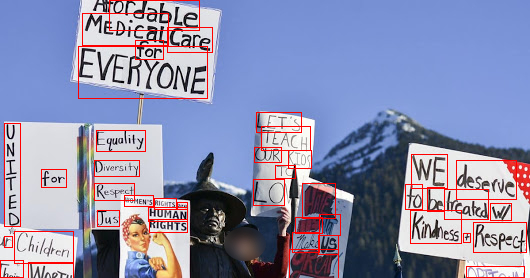

In [ ]:
import numpy as np
import os
from PIL import Image, ImageDraw

# based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()
# let's pick a random image
image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image n°{}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('/content/drive/MyDrive/ultra_hack/train/images/', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)

image

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = feature_extractor.pad_and_create_pixel_mask(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
batch = next(iter(train_dataloader))
batch.keys()

dict_keys(['pixel_values', 'pixel_mask', 'labels'])

In [ ]:
class Detr(pl.LightningModule):

     def __init__(self, lr, lr_backbone, weight_decay):
         super().__init__()
         # replace COCO classification head with custom head
         self.model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50", 
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         # see https://github.com/PyTorchLightning/pytorch-lightning/pull/1896
         self.lr = lr
         self.lr_backbone = lr_backbone
         self.weight_decay = weight_decay

     def forward(self, pixel_values, pixel_mask):
       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

       return outputs
     
     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       pixel_mask = batch["pixel_mask"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)     
        # logs metrics for each training_step,
        # and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def configure_optimizers(self):
        param_dicts = [
              {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
              {
                  "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                  "lr": self.lr_backbone,
              },
        ]
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr,
                                  weight_decay=self.weight_decay)
        
        return optimizer

     def train_dataloader(self):
        return train_dataloader

In [ ]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

In [ ]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)
# sanity check
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Downloading:   0%|          | 0.00/4.48k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/159M [00:00<?, ?B/s]

Downloading: "https://github.com/rwightman/pytorch-image-models/releases/download/v0.1-weights/resnet50_ram-a26f946b.pth" to /root/.cache/torch/hub/checkpoints/resnet50_ram-a26f946b.pth
Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([2, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([2]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.7/dist-packages/transformers/models/detr/modeling_detr.py:423: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This resul

In [ ]:
# sanity check
outputs.logits.shape

torch.Size([4, 100, 2])

In [ ]:
model

Detr(
  (model): DetrForObjectDetection(
    (model): DetrModel(
      (backbone): DetrConvModel(
        (conv_encoder): DetrTimmConvEncoder(
          (model): FeatureListNet(
            (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
            (bn1): DetrFrozenBatchNorm2d()
            (act1): ReLU(inplace=True)
            (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
            (layer1): Sequential(
              (0): Bottleneck(
                (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn1): DetrFrozenBatchNorm2d()
                (act1): ReLU(inplace=True)
                (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
                (bn2): DetrFrozenBatchNorm2d()
                (act2): ReLU(inplace=True)
                (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
                (bn3)

In [ ]:
trainer = Trainer(gpus=1, max_epochs=25, gradient_clip_val=0.1, enable_checkpointing=True, logger=True)
trainer.fit(model)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.037   Total estimated model params size (MB)
/usr/local/lib/python3.7/dist-packages/pytorch_lightning/trainer/data_loading.py:117: UserWarning: The dataloader, train_dataloader, does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` (try 4 which is the number of cpus on this machine) in the `DataLoader` init to improve performance.
  f"The dataloader, {name}, does not have many workers which may be a bottleneck."


Training: 0it [00:00, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/models/detr/modeling_detr.py:423: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.embedding_dim)
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


In [ ]:
PATH = '/content/model/DETR_25.pth'
torch.save(model.state_dict(), PATH)

In [ ]:
#model = model.load_from_checkpoint(checkpoint_path="/content/lightning_logs/version_0/checkpoints/epoch=6-step=3317.ckpt")

## Define very small set

In [ ]:
val_cocoIm_dir = '/content/coco/val/images/'
!mkdir -p $val_cocoIm_dir && rm -rf $val_cocoIm_dir/*

val_cocoGT_dir = '/content/coco/val/labels/'
!mkdir -p $val_cocoGT_dir && rm -rf $val_cocoGT_dir/*

if __name__ == "__main__":
    icdar_2017_mlt = Dataset('huawei_mlt', '2017',
                             '/content/drive/MyDrive/ultra_hack/train/train_labels/',
                             '/content/drive/MyDrive/ultra_hack/train/images_partial/')


    datasets = [icdar_2017_mlt]#, icdar_2019_lsvt, icdar_2019_art]

    coco_images_dir = '/content/coco/val/images/'
    coco_label_file = '/content/coco/val/labels/labels_partial.json'

    converter = COCOConverter(datasets, coco_images_dir, coco_label_file)
    converter.convert()

start converting...
converting huawei_mlt


  0%|          | 0/2000 [00:00<?, ?it/s]

Done. 17 images totally.


In [ ]:
file = '/content/coco/val/labels/labels_partial.json'
show_catids(file)
coco_compressor(file)

{'id': 1, 'name': 'text', 'supercategory': 'foreground'}

total categories = 1.  Use 1 for detr 'num_classes'
Saving /content/coco/val/labels/labels_partial.json to compact_labels_partial.json


In [ ]:
class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, feature_extractor, train=True):
        #ann_file = os.path.join(img_folder, "custom_train.json" if train else "custom_val.json")
        #ann_file = os.path.join(img_folder, "../labels/labels.json")
        ann_file = '/content/compact_labels_partial.json'#
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.feature_extractor = feature_extractor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        img, target = super(CocoDetection, self).__getitem__(idx)
        
        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.feature_extractor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

In [ ]:
val_dataset = CocoDetection(img_folder='/content/drive/MyDrive/ultra_hack/train/images_partial/', feature_extractor=feature_extractor, train=False)

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


In [ ]:
print("Number of validation examples:", len(val_dataset))

Number of validation examples: 16


In [ ]:
from datasets import get_coco_api_from_dataset
base_ds = get_coco_api_from_dataset(val_dataset) # skipping the time to prepare the val data to coco format

In [ ]:
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=1)

# Evaluate on a very small dataset due to lack of time

In [ ]:
from datasets.coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

iou_types = ['bbox']
coco_evaluator = CocoEvaluator(base_ds, iou_types) # initialize evaluator with ground truths

device = torch.device("cpu" if torch.cuda.is_available() else "cpu")

model.to(device)
model.eval()

print("Running evaluation...")

for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized

    # forward pass
    outputs = model.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = feature_extractor.post_process(outputs, orig_target_sizes) # convert outputs of model to COCO api
    res = {target['image_id'].item(): output for target, output in zip(labels, results)}
    coco_evaluator.update(res)

coco_evaluator.synchronize_between_processes()
coco_evaluator.accumulate()
coco_evaluator.summarize()

Running evaluation...


  0%|          | 0/16 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/models/detr/modeling_detr.py:423: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.embedding_dim)


Accumulating evaluation results...
DONE (t=0.02s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.199
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.410
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.167
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.002
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.201
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.371
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.072
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.257
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.348
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.035
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.350
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= la

# Inference and visualization for some examples

In [ ]:
import torch
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

def plot_results(pil_img, prob, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for p, (xmin, ymin, xmax, ymax), c in zip(prob, boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        cl = p.argmax()
        #text = f'{id2label[cl.item()]}: {p[cl]:0.2f}'
        #ax.text(xmin, ymin, text, fontsize=15, bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

In [ ]:
def visualize_predictions(image, outputs, threshold=0.7):
  # keep only predictions with confidence >= threshold
  probas = outputs.logits.softmax(-1)[0, :, :-1]
  keep = probas.max(-1).values >= threshold
  
  # convert predicted boxes from [0; 1] to image scales
  bboxes_scaled = rescale_bboxes(outputs.pred_boxes[0, keep].cpu(), image.size)

  # plot results
  plot_results(image, probas[keep], bboxes_scaled)

/usr/local/lib/python3.7/dist-packages/transformers/models/detr/modeling_detr.py:423: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  dim_t = self.temperature ** (2 * (dim_t // 2) / self.embedding_dim)


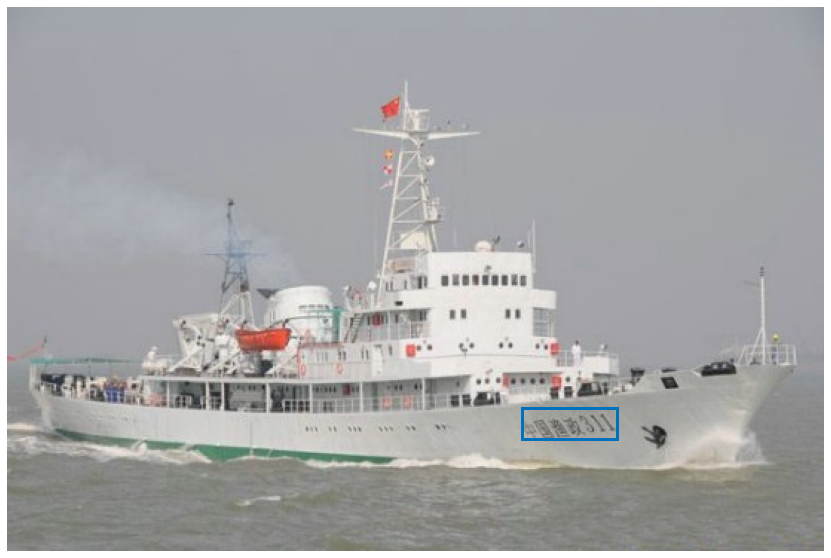

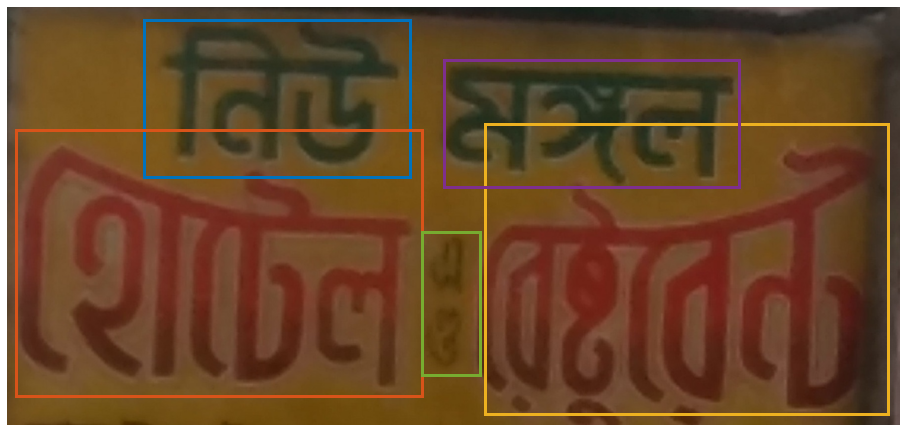

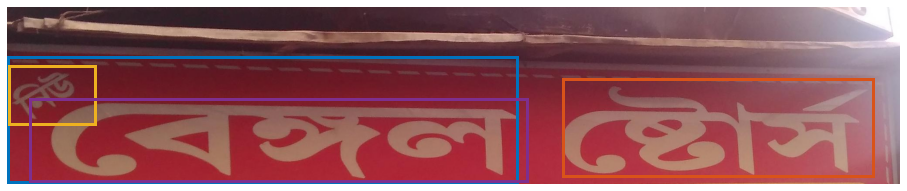

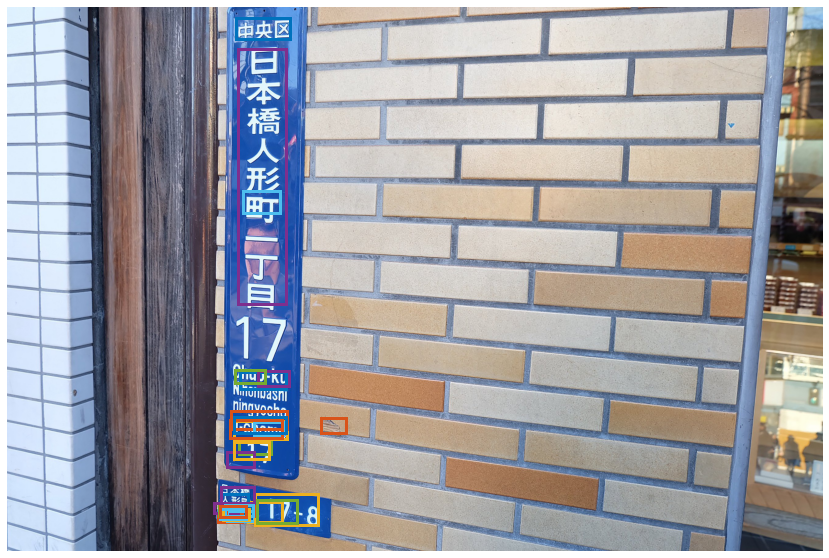

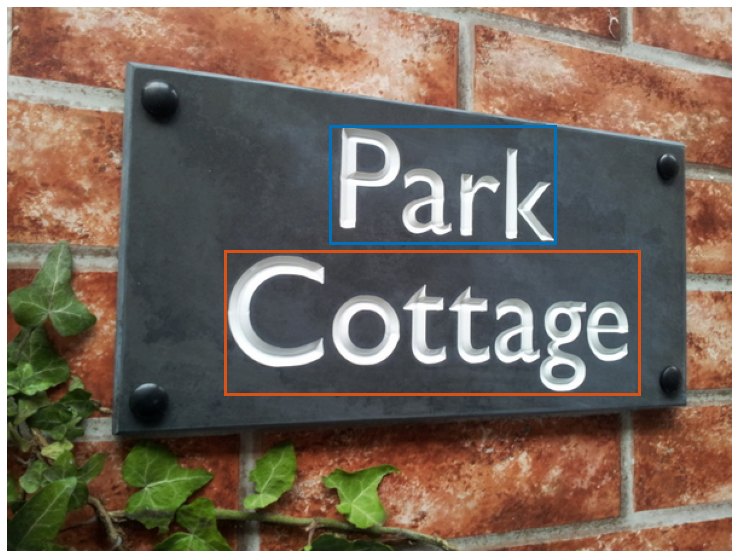

In [ ]:
for i in range(10):
  #We can use the image_id in target to know which image it is
  pixel_values, target = val_dataset[i]
  pixel_values = pixel_values.unsqueeze(0).to(device)
  # forward pass to get class logits and bounding boxes
  outputs = model(pixel_values=pixel_values, pixel_mask=None)

  image_id = target['image_id'].item()
  image = val_dataset.coco.loadImgs(image_id)[0]
  image = Image.open(os.path.join('/content/drive/MyDrive/ultra_hack/train/images_partial/', image['file_name']))

  visualize_predictions(image, outputs, threshold=0.85)